Import Libraries

In [1]:
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
import sqlite3 
import json
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OrdinalEncoder

Data Acquisition

Load CSV file:

In [2]:
df = pd.read_csv(r"D:\Python_rnw\one\Data-PreProcessing & Feature Engineering\final1\bank_customer_dataset_2000_rows.csv")

In [3]:
df_before = df.copy()

Load Json

In [4]:
d1 = pd.read_json(r"D:\Python_rnw\one\Data-PreProcessing & Feature Engineering\final1\bank_customer_json.json")
print("JSON file Successfully loaded")
df.head()

JSON file Successfully loaded


,customer_id,age,gender,region,education_level,employment_type,annual_income,loan_amount,loan_purpose,credit_score,repayment_history,transaction_count,spending_ratio,join_date,default_flag
0,100001,56.0,Female,North,Graduate,Salaried,94913.86,7438.84,Home,671.0,6,34,8.78,09:52.3,0
1,100002,69.0,Male,South,Graduate,Salaried,30853.63,37162.28,Home,682.0,12,288,11.25,09:52.3,1
2,100003,46.0,Female,South,Secondary,Salaried,57234.09,8660.35,Business,590.0,3,255,5.67,09:52.3,0
3,100004,32.0,Other,East,Graduate,Salaried,48368.82,51526.04,Car,740.0,0,126,87.19,09:52.3,0
4,100005,60.0,Male,North,Secondary,Salaried,75061.14,34934.58,Education,671.0,7,209,41.75,09:52.3,0


API KEY

In [4]:
with open("api_config.json") as f:
    config = json.load(f)

api_key = config["api_key"]
print("API KEY=",api_key)

API KEY= 70ec0831bcbb17320acba2640187172429e6ff84bd9ef085af52fc3888c832a6


PART C: DATA UNDERSTANDING & CLEANING

In [5]:
df.head()

,customer_id,age,gender,region,education_level,employment_type,annual_income,loan_amount,loan_purpose,credit_score,repayment_history,transaction_count,spending_ratio,join_date,default_flag
0,100001,56.0,Female,North,Graduate,Salaried,94913.86,7438.84,Home,671.0,6,34,8.78,09:52.3,0
1,100002,69.0,Male,South,Graduate,Salaried,30853.63,37162.28,Home,682.0,12,288,11.25,09:52.3,1
2,100003,46.0,Female,South,Secondary,Salaried,57234.09,8660.35,Business,590.0,3,255,5.67,09:52.3,0
3,100004,32.0,Other,East,Graduate,Salaried,48368.82,51526.04,Car,740.0,0,126,87.19,09:52.3,0
4,100005,60.0,Male,North,Secondary,Salaried,75061.14,34934.58,Education,671.0,7,209,41.75,09:52.3,0


In [6]:
df.tail()

,customer_id,age,gender,region,education_level,employment_type,annual_income,loan_amount,loan_purpose,credit_score,repayment_history,transaction_count,spending_ratio,join_date,default_flag
1995,101996,63.0,Female,South,Secondary,Salaried,69545.20,26598.43,Education,602.0,0,234,62.96,09:52.4,0
1996,101997,67.0,Female,South,Secondary,Self-Employed,96712.73,21557.52,Car,615.0,2,268,13.25,09:52.4,0
1997,101998,69.0,Female,East,Graduate,Self-Employed,38187.88,32480.66,Other,782.0,1,104,6.89,09:52.4,0
1998,101999,24.0,Male,West,Graduate,Salaried,33894.01,15405.69,Business,599.0,2,134,9.57,09:52.4,1
1999,102000,20.0,Female,South,Secondary,Self-Employed,74750.58,4079.13,Home,640.0,4,33,59.85,09:52.4,0


In [7]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        2000 non-null   int64  
 1   age                1900 non-null   float64
 2   gender             2000 non-null   str    
 3   region             2000 non-null   str    
 4   education_level    2000 non-null   str    
 5   employment_type    1900 non-null   str    
 6   annual_income      2000 non-null   float64
 7   loan_amount        2000 non-null   float64
 8   loan_purpose       2000 non-null   str    
 9   credit_score       1900 non-null   float64
 10  repayment_history  2000 non-null   int64  
 11  transaction_count  2000 non-null   int64  
 12  spending_ratio     2000 non-null   float64
 13  join_date          2000 non-null   str    
 14  default_flag       2000 non-null   int64  
dtypes: float64(5), int64(4), str(6)
memory usage: 234.5 KB


In [8]:
df.shape

(2000, 15)

In [9]:
df.describe()

,customer_id,age,annual_income,loan_amount,credit_score,repayment_history,transaction_count,spending_ratio,default_flag
count,2000.000000,1900.000000,2000.000000,2000.000000,1900.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,101000.500000,43.835789,62610.166385,25763.361035,648.474737,6.005500,147.897000,50.991370,0.393500
std,577.494589,14.902187,33410.313382,14896.632501,70.603036,3.805747,87.894568,26.452371,0.488648
min,100001.000000,18.000000,270.480000,24.950000,441.000000,0.000000,1.000000,5.000000,0.000000
25%,100500.750000,31.000000,42975.452500,14598.955000,599.000000,3.000000,71.000000,27.947500,0.000000
50%,101000.500000,44.000000,60110.400000,25490.575000,647.500000,6.000000,145.000000,51.955000,0.000000
75%,101500.250000,56.000000,77812.097500,35167.667500,696.000000,9.000000,227.000000,73.970000,1.000000
max,102000.000000,69.000000,365205.570000,123753.520000,850.000000,12.000000,299.000000,94.990000,1.000000


In [10]:
#identify missing values in each column
mv= df.isnull().sum()
mp = (mv/len(df))*100

ms =  pd.DataFrame({
    "Missing Value": mv,
    "Missing Percentage(%)": mp.round(2)
})
ms

,Missing Value,Missing Percentage(%)
customer_id,0,0.0
age,100,5.0
gender,0,0.0
region,0,0.0
education_level,0,0.0
employment_type,100,5.0
annual_income,0,0.0
loan_amount,0,0.0
loan_purpose,0,0.0
credit_score,100,5.0


Report

In [ ]:
from ydata_profiling import ProfileReport
import pandas as pd

df = pd.read_csv(r"D:\Python_rnw\one\Data-PreProcessing & Feature Engineering\final1\bank_customer_dataset_2000_rows.csv")

profile = ProfileReport(
    df,
    title="Customer Credit Risk - Profiling Report",
    explorative=True
)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 15/15 [00:00<00:00, 20.30it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Handling Missing Values

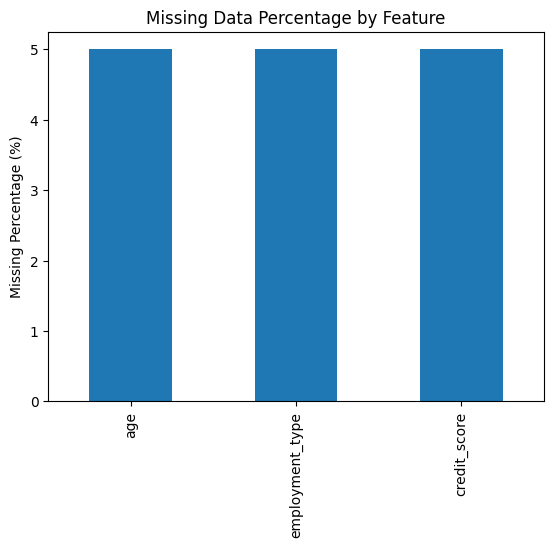

In [4]:
missing_percent = df.isnull().mean() * 100
missing_percent = missing_percent[missing_percent > 0]

missing_percent.sort_values().plot(kind="bar")
plt.ylabel("Missing Percentage (%)")
plt.title("Missing Data Percentage by Feature")
plt.show()

Simple Imputer (Mean – Numerical)

In [5]:
print(df_before.isnull().sum())

customer_id            0
age                  100
gender                 0
region                 0
education_level        0
employment_type      100
annual_income          0
loan_amount            0
loan_purpose           0
credit_score         100
repayment_history      0
transaction_count      0
spending_ratio         0
join_date              0
default_flag           0
dtype: int64


In [6]:
num_cols = df.select_dtypes(include=["float64", "int64"]).columns

mean_imputer = SimpleImputer(strategy="mean")
df[num_cols] = mean_imputer.fit_transform(df[num_cols])

print("After Mean Imputation")
print(df.isnull().sum())

After Mean Imputation
customer_id            0
age                    0
gender                 0
region                 0
education_level        0
employment_type      100
annual_income          0
loan_amount            0
loan_purpose           0
credit_score           0
repayment_history      0
transaction_count      0
spending_ratio         0
join_date              0
default_flag           0
dtype: int64


simple Imputer Most Frequent (Categorical)

In [7]:
cat_cols = df.select_dtypes(include=["object"]).columns

mode_imputer = SimpleImputer(strategy="most_frequent")
df[cat_cols] = mode_imputer.fit_transform(df[cat_cols])

print("After Mean Imputation")
print(df.isnull().sum())

After Mean Imputation
customer_id          0
age                  0
gender               0
region               0
education_level      0
employment_type      0
annual_income        0
loan_amount          0
loan_purpose         0
credit_score         0
repayment_history    0
transaction_count    0
spending_ratio       0
join_date            0
default_flag         0
dtype: int64


C:\Users\Admin\AppData\Local\Temp\ipykernel_2076\2714078406.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  cat_cols = df.select_dtypes(include=["object"]).columns


Missing Indicator + Random Sample

In [8]:
missing_mask = df["annual_income"].isna()

df.loc[missing_mask, "annual_income"] = (
    df["annual_income"]
    .dropna()
    .sample(missing_mask.sum(), replace=True)
    .values
)
missing_mask

0       False
1       False
2       False
3       False
4       False
        ...  
1995    False
1996    False
1997    False
1998    False
1999    False
Name: annual_income, Length: 2000, dtype: bool

KNN Imputer

In [9]:
# Create imputer object
imputer = KNNImputer(n_neighbors=5)

# Apply only to numeric columns
df[num_cols] = imputer.fit_transform(df[num_cols])

print("After KNN Imputation")
print(df[num_cols].isnull().sum())

After KNN Imputation
customer_id          0
age                  0
annual_income        0
loan_amount          0
credit_score         0
repayment_history    0
transaction_count    0
spending_ratio       0
default_flag         0
dtype: int64


MICE Imputer

In [10]:
mice_imputer = IterativeImputer(random_state=42)

data_mice = df.copy()

# Only numerical columns
data_mice[num_cols] = mice_imputer.fit_transform(data_mice[num_cols])

print("After MICE Imputation")
print(data_mice.isnull().sum())

After MICE Imputation
customer_id          0
age                  0
gender               0
region               0
education_level      0
employment_type      0
annual_income        0
loan_amount          0
loan_purpose         0
credit_score         0
repayment_history    0
transaction_count    0
spending_ratio       0
join_date            0
default_flag         0
dtype: int64


Droping Rows/Columns

In [11]:
threshold = 0.4  # 40%

missing_fraction = df.isnull().mean()

columns_to_drop = missing_fraction[missing_fraction > threshold].index

df_complete_cols = df.drop(columns=columns_to_drop)

print("Dropped columns:", list(columns_to_drop))
print("New shape:", df_complete_cols.shape)

Dropped columns: []
New shape: (2000, 15)


In [19]:
df_after = df_before.dropna()

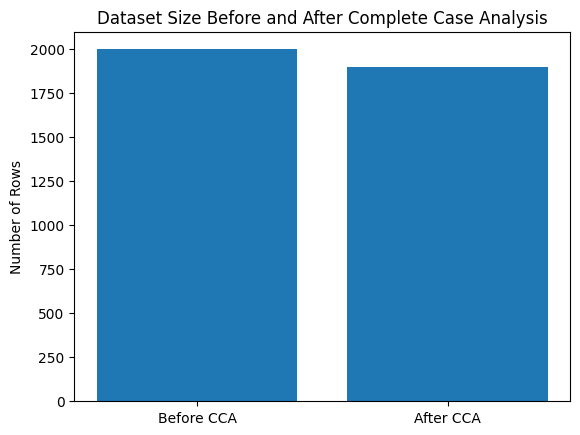

In [21]:
rows_before = df_before.shape[0]
rows_after = df_after.shape[0]

plt.figure()
plt.bar(["Before CCA", "After CCA"], [rows_before, rows_after])
plt.ylabel("Number of Rows")
plt.title("Dataset Size Before and After Complete Case Analysis")
plt.show()


Only 5% missing in 3 columns

Then expected data loss ≈ 10–15%
And here you can clearly see the difference before and after doing Case Analysis that size of the dataset reduced after doing the Analysis

In [24]:
df.isnull().sum()

customer_id          0
age                  0
gender               0
region               0
education_level      0
employment_type      0
annual_income        0
loan_amount          0
loan_purpose         0
credit_score         0
repayment_history    0
transaction_count    0
spending_ratio       0
join_date            0
default_flag         0
dtype: int64

In [23]:
mv= df.isnull().sum()
mp = (mv/len(df))*100

ms =  pd.DataFrame({
    "Missing Value": mv,
    "Missing Percentage(%)": mp.round(2)
})
ms

,Missing Value,Missing Percentage(%)
customer_id,0,0.0
age,0,0.0
gender,0,0.0
region,0,0.0
education_level,0,0.0
employment_type,0,0.0
annual_income,0,0.0
loan_amount,0,0.0
loan_purpose,0,0.0
credit_score,0,0.0


PART D:-Outliear Count

In [25]:
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

def count_outliers_iqr(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return ((series < lower) | (series > upper)).sum()

outlier_counts = {}

for col in num_cols:
    outlier_counts[col] = count_outliers_iqr(df[col])

outlier_counts
outlier_df = pd.DataFrame.from_dict(
    outlier_counts,
    orient='index',
    columns=['Outlier_Count']
)

outlier_df

,Outlier_Count
customer_id,0
age,0
annual_income,39
loan_amount,17
credit_score,12
repayment_history,0
transaction_count,0
spending_ratio,0
default_flag,0


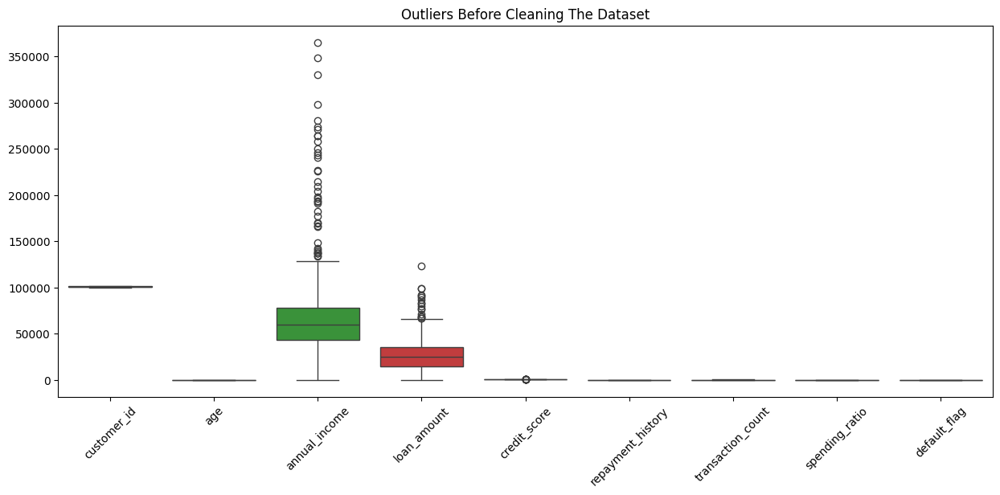

In [26]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df[num_cols])
plt.title("Outliers Before Cleaning The Dataset")
plt.xticks(rotation=45)
plt.show()

Through this graph you can visible see that there are outliers in the column-annual_income, loan_amount and few in credit_score. 

Text(0.5, 1.0, 'After')

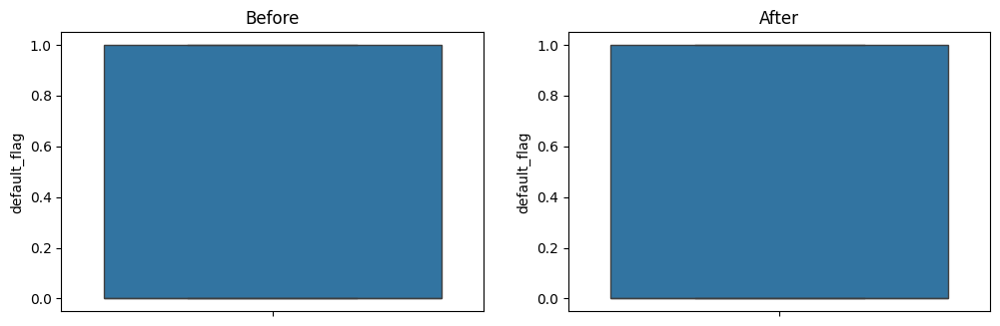

In [30]:
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.boxplot(df_before["default_flag"])
plt.title("Before")

plt.subplot(2,2,2)
sns.boxplot(df["default_flag"])
plt.title("After")

Z-Score

In [33]:
from scipy.stats import zscore

z = df.copy()
z = zscore(df[["annual_income","loan_amount","credit_score"]])
z = df[(abs(z) < 3).all(axis=1)]

print("Shape Before:", df.shape)
print("Shape After Z-score:", z.shape)

Shape Before: (1957, 15)
Shape After Z-score: (1955, 15)


IQR Method

In [35]:
numeric_df = df.select_dtypes(include=['number'])

Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = ((numeric_df < lower_bound) | 
            (numeric_df > upper_bound))

print("Outliers per column:")
print(outliers.sum())

Outliers per column:
customer_id          0
age                  0
annual_income        3
loan_amount          3
credit_score         9
repayment_history    0
transaction_count    0
spending_ratio       0
default_flag         0
dtype: int64


Percentile Method

In [38]:
per_df = df.copy()
cols = ["annual_income", "loan_amount", "credit_score"]

for col in cols:
    lower = df[col].quantile(0.01)
    upper = df[col].quantile(0.99)
    per_df[col] = per_df[col].clip(lower, upper)

print("Shape After Percentile:", per_df.shape)

Shape After Percentile: (1957, 15)


In [31]:
df[cols].describe()

,annual_income,loan_amount,credit_score
count,1957.000000,1957.000000,1957.000000
mean,59587.326014,25191.248532,648.381796
std,24485.096280,13760.714549,68.142155
min,5990.662800,449.008800,490.000000
25%,42525.580000,14538.840000,601.000000
50%,59568.710000,25285.130000,648.474737
75%,76502.390000,34761.120000,692.000000
max,115265.297200,56281.265600,809.880000


Winsorization Technique

In [46]:
from scipy.stats.mstats import winsorize
cols = ["annual_income", "loan_amount", "credit_score"]

for col in cols:
    lower = df[col].quantile(0.05)
    upper = df[col].quantile(0.95)
    df[col] = df[col].clip(lower, upper)
print("Winsorization Done")

Winsorization Done


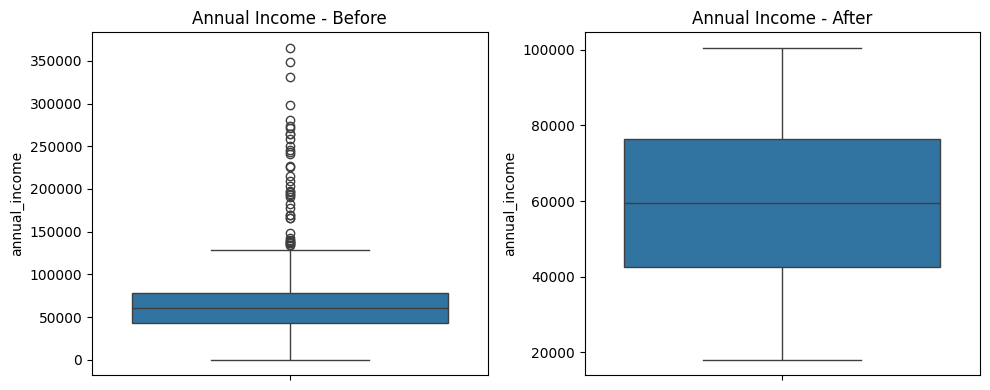

In [56]:
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
sns.boxplot(y=df_before["annual_income"])
plt.title("Annual Income - Before")

plt.subplot(1,2,2)
sns.boxplot(y=df["annual_income"])
plt.title("Annual Income - After")

plt.tight_layout()
plt.show()

In [44]:
df[cols].describe()


,annual_income,loan_amount,credit_score
count,1957.000000,1957.000000,1957.000000
mean,59561.295426,25076.645937,648.398863
std,23108.288321,13204.512433,63.431006
min,18108.448000,3291.940000,534.000000
25%,42525.580000,14538.840000,601.000000
50%,59568.710000,25285.130000,648.474737
75%,76502.390000,34761.120000,692.000000
max,100429.388000,48965.006000,767.000000


Here you can clearly see that after doing winsorization the there's some changes in min and max values

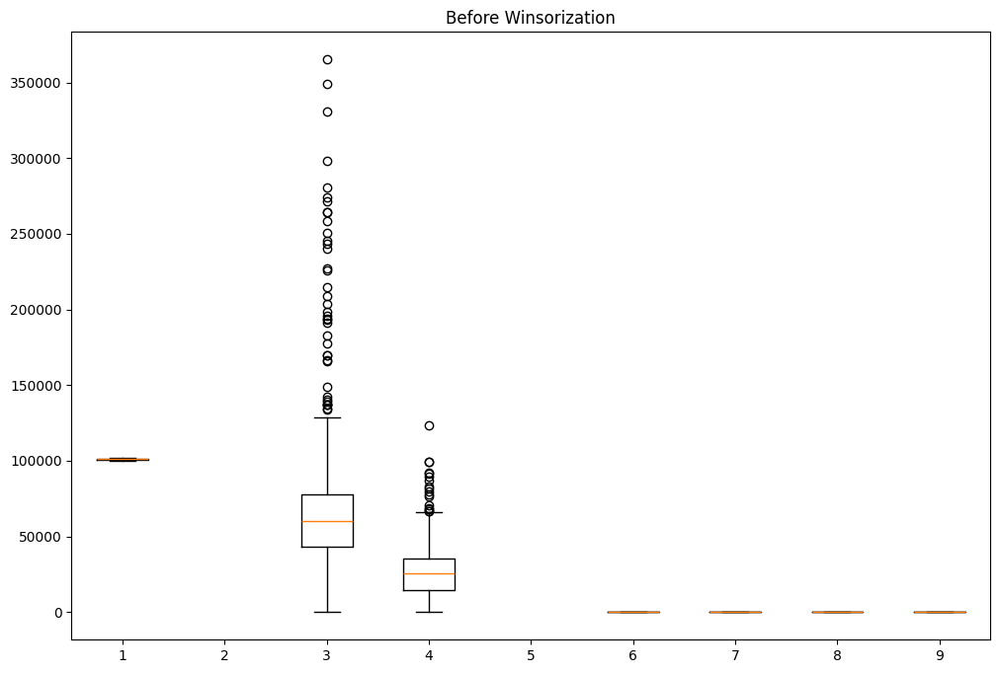

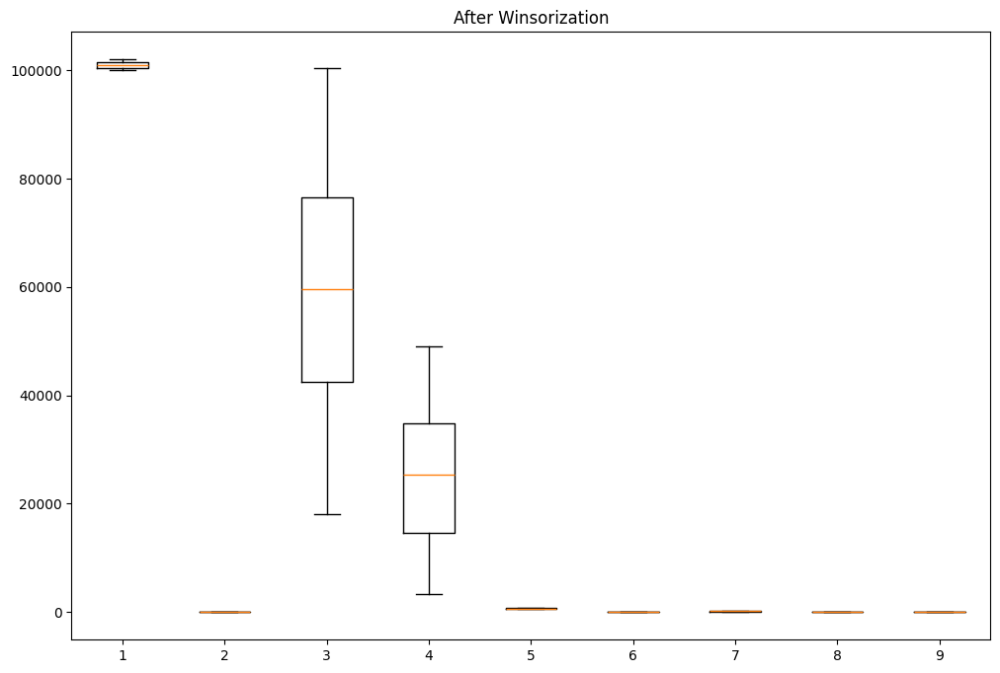

In [50]:
plt.figure(figsize=(12,8))
plt.boxplot(df_before[num_cols])
plt.title("Before Winsorization")
plt.show()

plt.figure(figsize=(12,8))
plt.boxplot(df[num_cols])
plt.title("After Winsorization")
plt.show()


Boxplots before and after winsorization demonstrate a reduction in extreme values. The whisker range becomes more compact, indicating successful outlier treatment while preserving the dataset size.

In [33]:
df.info()

<class 'pandas.DataFrame'>
Index: 1957 entries, 0 to 1999
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        1957 non-null   float64
 1   age                1957 non-null   float64
 2   gender             1957 non-null   str    
 3   region             1957 non-null   str    
 4   education_level    1957 non-null   str    
 5   employment_type    1957 non-null   str    
 6   annual_income      1957 non-null   float64
 7   loan_amount        1957 non-null   float64
 8   loan_purpose       1957 non-null   str    
 9   credit_score       1957 non-null   float64
 10  repayment_history  1957 non-null   float64
 11  transaction_count  1957 non-null   float64
 12  spending_ratio     1957 non-null   float64
 13  join_date          1957 non-null   str    
 14  default_flag       1957 non-null   float64
dtypes: float64(9), str(6)
memory usage: 244.6 KB


In [52]:
df_before["annual_income"].describe()
df["annual_income"].describe()

count      1957.000000
mean      59562.333975
std       23106.250848
min       18130.161600
25%       42525.580000
50%       59568.710000
75%       76502.390000
max      100428.413600
Name: annual_income, dtype: float64

PART E:- Feature Engineering 

Handle Variable Type

Mixed Variables-(Numerical + Categorical)

In [53]:
df.info()

<class 'pandas.DataFrame'>
Index: 1957 entries, 0 to 1999
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        1957 non-null   float64
 1   age                1957 non-null   float64
 2   gender             1957 non-null   str    
 3   region             1957 non-null   str    
 4   education_level    1957 non-null   str    
 5   employment_type    1957 non-null   str    
 6   annual_income      1957 non-null   float64
 7   loan_amount        1957 non-null   float64
 8   loan_purpose       1957 non-null   str    
 9   credit_score       1957 non-null   float64
 10  repayment_history  1957 non-null   float64
 11  transaction_count  1957 non-null   float64
 12  spending_ratio     1957 non-null   float64
 13  join_date          1957 non-null   str    
 14  default_flag       1957 non-null   float64
dtypes: float64(9), str(6)
memory usage: 244.6 KB


We don't have any mixed variables

Date and Time Variable 

In [58]:
df["join_date"] = pd.to_datetime(df["join_date"])

df["join_year"] = df["join_date"].dt.year
df["join_month"] = df["join_date"].dt.month
df["join_day"] = df["join_date"].dt.day
df["join_weekday"] = df["join_date"].dt.weekday


Encoding Categorical Variable

(A) Ordinal Encoding (Education Level)

In [68]:
education_order = {
    "High School": 1,
    "Bachelor": 2,
    "Master": 3,
    "PhD": 4
}

df["education_level"] = df["education_level"].map(education_order)
df["education_level"].head()

0   NaN
1   NaN
2   NaN
3   NaN
4   NaN
Name: education_level, dtype: float64

(B) Label Encoding (Binary Features)

In [69]:
df["gender"] = df["gender"].map({"Male": 0, "Female": 1})
df["gender"].head()

0   NaN
1   NaN
2   NaN
3   NaN
4   NaN
Name: gender, dtype: float64

(C) One-Hot Encoding (Region, Loan Purpose)

In [72]:
print(df.columns)


Index(['customer_id', 'age', 'gender', 'education_level', 'employment_type',
       'annual_income', 'loan_amount', 'credit_score', 'repayment_history',
       'transaction_count', 'spending_ratio', 'join_date', 'default_flag',
       'join_year', 'join_month', 'join_weekday', 'join_day', 'region_North',
       'region_South', 'region_West', 'loan_purpose_Car',
       'loan_purpose_Education', 'loan_purpose_Home', 'loan_purpose_Other',
       'income_group', 'high_income_flag', 'income_quantile',
       'income_kmeans_bin'],
      dtype='str')


In [74]:
df.head()

,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_South,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin
0,100001.0,56.0,NaN,NaN,Salaried,94913.86,7438.8400,671.0,6.0,34.0,...,False,False,False,False,True,False,High,1,Q4,0
1,100002.0,69.0,NaN,NaN,Salaried,30853.63,37162.2800,682.0,12.0,288.0,...,True,False,False,False,True,False,Medium,0,Q1,2
2,100003.0,46.0,NaN,NaN,Salaried,57234.09,8660.3500,590.0,3.0,255.0,...,True,False,False,False,False,False,Medium,0,Q2,1
3,100004.0,32.0,NaN,NaN,Salaried,48368.82,48962.0812,740.0,0.0,126.0,...,False,False,True,False,False,False,Medium,0,Q2,1
4,100005.0,60.0,NaN,NaN,Salaried,75061.14,34934.5800,671.0,7.0,209.0,...,False,False,False,True,False,False,High,1,Q3,0


Encoding Numerical Features

(A) Binning (Income Groups)

In [75]:
df["income_group"] = pd.cut(
    df["annual_income"],
    bins=[0, 30000, 70000, 150000],
    labels=["Low", "Medium", "High"]
)

df[['annual_income','income_group']].head()

,annual_income,income_group
0,94913.86,High
1,30853.63,Medium
2,57234.09,Medium
3,48368.82,Medium
4,75061.14,High


(B) Binarization (Threshold Flag)

In [77]:
df["high_income_flag"] = (df["annual_income"] > 70000).astype(int)
df.head()

,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_South,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin
0,100001.0,56.0,NaN,NaN,Salaried,94913.86,7438.8400,671.0,6.0,34.0,...,False,False,False,False,True,False,High,1,Q4,0
1,100002.0,69.0,NaN,NaN,Salaried,30853.63,37162.2800,682.0,12.0,288.0,...,True,False,False,False,True,False,Medium,0,Q1,2
2,100003.0,46.0,NaN,NaN,Salaried,57234.09,8660.3500,590.0,3.0,255.0,...,True,False,False,False,False,False,Medium,0,Q2,1
3,100004.0,32.0,NaN,NaN,Salaried,48368.82,48962.0812,740.0,0.0,126.0,...,False,False,True,False,False,False,Medium,0,Q2,1
4,100005.0,60.0,NaN,NaN,Salaried,75061.14,34934.5800,671.0,7.0,209.0,...,False,False,False,True,False,False,High,1,Q3,0


(C) Quantile Binning

In [78]:
df["income_quantile"] = pd.qcut(
    df["annual_income"],
    q=4,
    labels=["Q1", "Q2", "Q3", "Q4"]
)

df[['annual_income','income_quantile']].head()

,annual_income,income_quantile
0,94913.86,Q4
1,30853.63,Q1
2,57234.09,Q2
3,48368.82,Q2
4,75061.14,Q3


(D) K-Means Binning

In [83]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=42)
df["income_kmeans_bin"] = kmeans.fit_predict(df[["annual_income"]])

df[['annual_income','income_kmeans_bin']].head()

,annual_income,income_kmeans_bin
0,94913.86,0
1,30853.63,2
2,57234.09,1
3,48368.82,1
4,75061.14,0


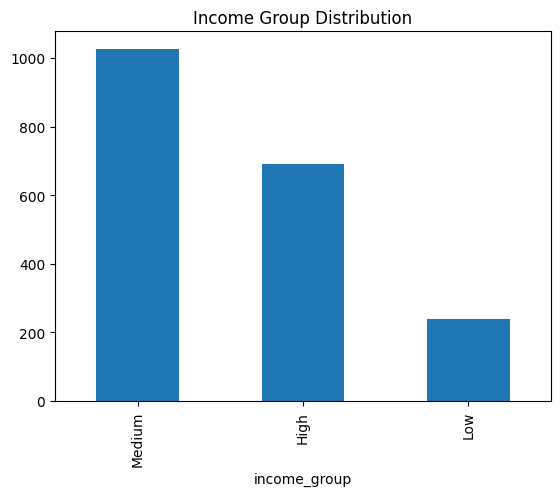

In [66]:
df["income_group"].value_counts().plot(kind="bar")
plt.title("Income Group Distribution")
plt.show()

Part F:- Feature Scalling

In [84]:
#Select Only Numerical Features
num_cols = df.select_dtypes(include=["int64", "float64"]).columns
num_cols = num_cols.drop("default_flag")

Apply Multiple Scalling Methods

Standardization (Z-Score Scaling)

In [123]:
from sklearn.preprocessing import StandardScaler

scaler_std = StandardScaler()
df_standardized = df_clean.copy()
df_standardized[num_cols] = scaler_std.fit_transform(df_clean[num_cols])

df_standardized.head()


C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:1207: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:1212: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:1236: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_South,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin
0,-1.731494,0.843280,NaN,NaN,Salaried,1.530346,-1.336223,0.356402,-0.003223,-1.294158,...,False,False,False,False,True,False,High,1,Q4,0
1,-1.729762,1.737387,NaN,NaN,Salaried,-1.242782,0.915549,0.529863,1.573866,1.595002,...,True,False,False,False,True,False,Medium,0,Q1,2
2,-1.728031,0.155505,NaN,NaN,Salaried,-0.100788,-1.243685,-0.920903,-0.791768,1.219639,...,True,False,False,False,False,False,Medium,0,Q2,1
3,-1.726300,-0.807379,NaN,NaN,Salaried,-0.484560,1.809472,1.444476,-1.580313,-0.247691,...,False,False,True,False,False,False,Medium,0,Q2,1
4,-1.724569,1.118390,NaN,NaN,Salaried,0.670934,0.746784,0.356402,0.259625,0.696405,...,False,False,False,True,False,False,High,1,Q3,0


Normalization 


In [100]:
df_after.isnull().sum()


customer_id          0
age                  0
gender               0
region               0
education_level      0
employment_type      0
annual_income        0
loan_amount          0
loan_purpose         0
credit_score         0
repayment_history    0
transaction_count    0
spending_ratio       0
join_date            0
default_flag         0
dtype: int64

In [120]:
df_clean = df.copy()

num_cols = df_clean.select_dtypes(include=["int64", "float64"]).columns
if "default_flag" in num_cols:
    num_cols = num_cols.drop("default_flag")

df_clean[num_cols] = df_clean[num_cols].fillna(df_clean[num_cols].median())


In [184]:
from sklearn.preprocessing import Normalizer

scaler_norm = Normalizer()
df_normalized = df_clean.copy()

df_normalized.head()


,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin,spending_to_income_ratio,debt_to_income_ratio,avg_monthly_transactions
0,100001.0,56.0,NaN,NaN,Salaried,94913.86,7438.8400,671.0,6.0,34.0,...,False,True,False,High,1,Q4,0,0.000093,0.078375,2.833333
1,100002.0,69.0,NaN,NaN,Salaried,30853.63,37162.2800,682.0,12.0,288.0,...,False,True,False,Medium,0,Q1,2,0.000365,1.204470,24.000000
2,100003.0,46.0,NaN,NaN,Salaried,57234.09,8660.3500,590.0,3.0,255.0,...,False,False,False,Medium,0,Q2,1,0.000099,0.151315,21.250000
3,100004.0,32.0,NaN,NaN,Salaried,48368.82,48962.0812,740.0,0.0,126.0,...,False,False,False,Medium,0,Q2,1,0.001803,1.012265,10.500000
4,100005.0,60.0,NaN,NaN,Salaried,75061.14,34934.5800,671.0,7.0,209.0,...,True,False,False,High,1,Q3,0,0.000556,0.465415,17.416667


Min-Max Scaling

In [117]:
from sklearn.preprocessing import MinMaxScaler

scaler_minmax = MinMaxScaler()
df_minmax = df_clean.copy()
df_minmax[num_cols] = scaler_minmax.fit_transform(df_clean[num_cols])

df_minmax.head()


C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\_array_api.py:794: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmin(X, axis=axis))
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\_array_api.py:814: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmax(X, axis=axis))


,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_South,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin
0,0.000000,0.745098,NaN,NaN,Salaried,0.932993,0.090596,0.587983,0.500000,0.110738,...,False,False,False,False,True,False,High,1,Q4,0
1,0.000500,1.000000,NaN,NaN,Salaried,0.154602,0.741572,0.635193,1.000000,0.963087,...,True,False,False,False,True,False,Medium,0,Q1,2
2,0.001001,0.549020,NaN,NaN,Salaried,0.475149,0.117348,0.240343,0.250000,0.852349,...,True,False,False,False,False,False,Medium,0,Q2,1
3,0.001501,0.274510,NaN,NaN,Salaried,0.367428,1.000000,0.884120,0.000000,0.419463,...,False,False,True,False,False,False,Medium,0,Q2,1
4,0.002001,0.823529,NaN,NaN,Salaried,0.691764,0.692783,0.587983,0.583333,0.697987,...,False,False,False,True,False,False,High,1,Q3,0


MaxAbs Scaling

In [ ]:
from sklearn.preprocessing import MaxAbsScaler

scaler_maxabs = MaxAbsScaler()
df_maxabs = df_clean.copy()
df_maxabs[num_cols] = scaler_maxabs.fit_transform(df_clean[num_cols])

df_maxabs.head()

C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\_array_api.py:814: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmax(X, axis=axis))


,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_South,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin
0,0.980402,0.811594,NaN,NaN,Salaried,0.945090,0.151931,0.874837,0.500000,0.113712,...,False,False,False,False,True,False,High,1,Q4,0
1,0.980412,1.000000,NaN,NaN,Salaried,0.307220,0.759001,0.889179,1.000000,0.963211,...,True,False,False,False,True,False,Medium,0,Q1,2
2,0.980422,0.666667,NaN,NaN,Salaried,0.569899,0.176879,0.769231,0.250000,0.852843,...,True,False,False,False,False,False,Medium,0,Q2,1
3,0.980431,0.463768,NaN,NaN,Salaried,0.481625,1.000000,0.964798,0.000000,0.421405,...,False,False,True,False,False,False,Medium,0,Q2,1
4,0.980441,0.869565,NaN,NaN,Salaried,0.747409,0.713503,0.874837,0.583333,0.698997,...,False,False,False,True,False,False,High,1,Q3,0


Robust Scaling

In [118]:
from sklearn.preprocessing import RobustScaler

scaler_robust = RobustScaler()
df_robust = df_clean.copy()
df_robust[num_cols] = scaler_robust.fit_transform(df_clean[num_cols])

df_robust.head()


C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_South,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin
0,-1.000000,0.506842,NaN,NaN,Salaried,1.040273,-0.882506,0.247530,0.000000,-0.711538,...,False,False,False,False,True,False,High,1,Q4,0
1,-0.999003,1.048509,NaN,NaN,Salaried,-0.845138,0.587330,0.368409,1.000000,0.916667,...,True,False,False,False,True,False,Medium,0,Q1,2
2,-0.998006,0.090175,NaN,NaN,Salaried,-0.068712,-0.822102,-0.642580,-0.500000,0.705128,...,True,False,False,False,False,False,Medium,0,Q2,1
3,-0.997009,-0.493158,NaN,NaN,Salaried,-0.329633,1.170835,1.005772,-1.000000,-0.121795,...,False,False,True,False,False,False,Medium,0,Q2,1
4,-0.996012,0.673509,NaN,NaN,Salaried,0.455971,0.477169,0.247530,0.166667,0.410256,...,False,False,False,True,False,False,High,1,Q3,0


In [128]:
pd.DataFrame({
    "Original": df_clean["annual_income"].head(),
    "Standardized": df_standardized["annual_income"].head(),
    "MinMax": df_minmax["annual_income"].head(),
    "MaxAbs": df_maxabs["annual_income"].head(),
    "Robust": df_robust["annual_income"].head(),
})


,Original,Standardized,MinMax,MaxAbs,Robust
0,94913.86,1.530346,0.932993,0.945090,1.040273
1,30853.63,-1.242782,0.154602,0.307220,-0.845138
2,57234.09,-0.100788,0.475149,0.569899,-0.068712
3,48368.82,-0.484560,0.367428,0.481625,-0.329633
4,75061.14,0.670934,0.691764,0.747409,0.455971


PART G:-Feature Construction and Transformations

Apply Transformations:-

LOG TRANSFORMER

In [129]:
from sklearn.preprocessing import FunctionTransformer
import numpy as np

log_transformer = FunctionTransformer(np.log1p)

df_log = df_clean.copy()
df_log["annual_income_log"] = log_transformer.fit_transform(
    df_clean[["annual_income"]]
)

df_log[["annual_income", "annual_income_log"]].head()


,annual_income,annual_income_log
0,94913.86,11.460736
1,30853.63,10.337042
2,57234.09,10.954922
3,48368.82,10.786631
4,75061.14,11.226072


SQUARE ROOT TRANSFORM

In [130]:
sqrt_transformer = FunctionTransformer(np.sqrt)

df_sqrt = df_clean.copy()
df_sqrt["loan_amount_sqrt"] = sqrt_transformer.fit_transform(
    df_clean[["loan_amount"]]
)

df_sqrt[["loan_amount", "loan_amount_sqrt"]].head()


,loan_amount,loan_amount_sqrt
0,7438.8400,86.248710
1,37162.2800,192.775206
2,8660.3500,93.061001
3,48962.0812,221.273770
4,34934.5800,186.907945


Reciprocal Transformation

In [131]:
reciprocal_transformer = FunctionTransformer(lambda x: 1 / (x + 1))

df_recip = df_clean.copy()
df_recip["credit_score_recip"] = reciprocal_transformer.fit_transform(
    df_clean[["credit_score"]]
)

df_recip[["credit_score", "credit_score_recip"]].head()


,credit_score,credit_score_recip
0,671.0,0.001488
1,682.0,0.001464
2,590.0,0.001692
3,740.0,0.001350
4,671.0,0.001488


PowerTransformer (Box-Cox & Yeo-Johnson)

Yeo-Johnson (Works with Negative & Zero Values)

In [136]:
from sklearn.preprocessing import PowerTransformer

pt_yeo = PowerTransformer(method="yeo-johnson")

df_yeo = df_clean.copy()
df_yeo['income_yeo'] = pt_yeo.fit_transform(df[['annual_income']])

df_yeo.head()


,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin,income_yeo
0,100001.0,56.0,NaN,NaN,Salaried,94913.86,7438.8400,671.0,6.0,34.0,...,False,False,False,True,False,High,1,Q4,0,1.489928
1,100002.0,69.0,NaN,NaN,Salaried,30853.63,37162.2800,682.0,12.0,288.0,...,False,False,False,True,False,Medium,0,Q1,2,-1.252206
2,100003.0,46.0,NaN,NaN,Salaried,57234.09,8660.3500,590.0,3.0,255.0,...,False,False,False,False,False,Medium,0,Q2,1,-0.070294
3,100004.0,32.0,NaN,NaN,Salaried,48368.82,48962.0812,740.0,0.0,126.0,...,False,True,False,False,False,Medium,0,Q2,1,-0.456436
4,100005.0,60.0,NaN,NaN,Salaried,75061.14,34934.5800,671.0,7.0,209.0,...,False,False,True,False,False,High,1,Q3,0,0.681848


Box-Cox (Only Positive Values)

In [133]:
pt_boxcox = PowerTransformer(method="box-cox")

df_boxcox = df_clean.copy()
df_boxcox["annual_income_boxcox"] = pt_boxcox.fit_transform(
    df_clean[["annual_income"]]
)

df_boxcox[["annual_income", "annual_income_boxcox"]].head()


,annual_income,annual_income_boxcox
0,94913.86,1.489927
1,30853.63,-1.252206
2,57234.09,-0.070293
3,48368.82,-0.456436
4,75061.14,0.681849


Column Transformer

In [141]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

numeric_features = num_cols
categorical_features = ["region_North", "region_South"]  # example

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_features),
        ("cat", OneHotEncoder(drop="first"), categorical_features)
    ]
)

X_transformed = preprocessor.fit_transform(df_clean)
X_transformed

C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:1207: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:1212: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:1236: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


array([[-1.7314935 ,  0.84328013,         nan, ..., -1.60104648,
         1.        ,  0.        ],
       [-1.72976231,  1.73738726,         nan, ..., -1.50753257,
         0.        ,  1.        ],
       [-1.72803112,  0.15550541,         nan, ..., -1.71879071,
         0.        ,  1.        ],
       ...,
       [ 1.72569309,  1.73738726,         nan, ..., -1.67260166,
         0.        ,  0.        ],
       [ 1.72742428, -1.35759896,         nan, ..., -1.57113717,
         0.        ,  0.        ],
       [ 1.72915547, -1.63270885,         nan, ...,  0.33245775,
         0.        ,  1.        ]])

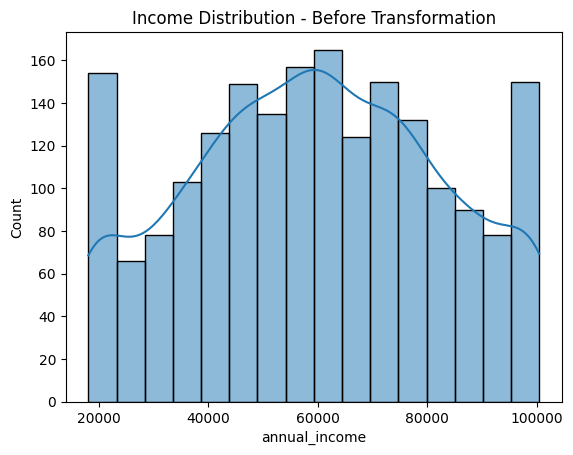

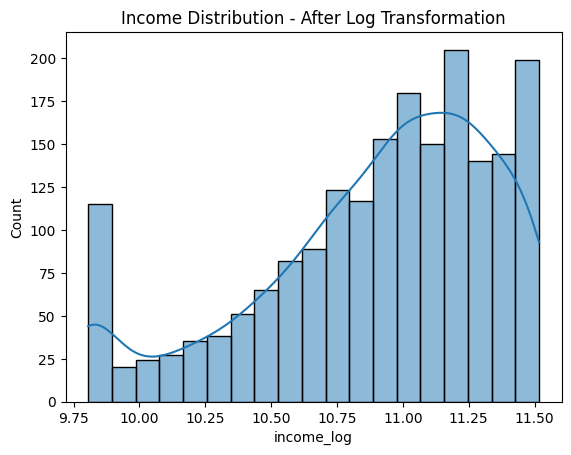

In [154]:
#BEFORE
plt.figure()
sns.histplot(df['annual_income'], kde=True)
plt.title("Income Distribution - Before Transformation")
plt.show()

#AFTER
df['income_log'] = np.log1p(df['annual_income'])  # log(1+x) safer

plt.figure()
sns.histplot(df['income_log'], kde=True)
plt.title("Income Distribution - After Log Transformation")
plt.show()

Apply Construction:-

Debt-to-Income Ratio

In [145]:
df_clean["debt_to_income_ratio"] = (
    df_clean["loan_amount"] / df_clean["annual_income"]
)

df_clean[["loan_amount", "annual_income", "debt_to_income_ratio"]].head()


,loan_amount,annual_income,debt_to_income_ratio
0,7438.8400,94913.86,0.078375
1,37162.2800,30853.63,1.204470
2,8660.3500,57234.09,0.151315
3,48962.0812,48368.82,1.012265
4,34934.5800,75061.14,0.465415


Average Monthly Transactions

In [146]:
df_clean["avg_monthly_transactions"] = (
    df_clean["transaction_count"] / 12
)

df_clean[["transaction_count", "avg_monthly_transactions"]].head()


,transaction_count,avg_monthly_transactions
0,34.0,2.833333
1,288.0,24.000000
2,255.0,21.250000
3,126.0,10.500000
4,209.0,17.416667


Spending-to-Income Ratio

In [143]:
df_clean["spending_to_income_ratio"] = (
    df_clean["spending_ratio"] / df_clean["annual_income"]
)

df_clean[["spending_ratio", "annual_income", "spending_to_income_ratio"]].head()

,spending_ratio,annual_income,spending_to_income_ratio
0,8.78,94913.86,0.000093
1,11.25,30853.63,0.000365
2,5.67,57234.09,0.000099
3,87.19,48368.82,0.001803
4,41.75,75061.14,0.000556


PART H:-Final Deliverable

C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Admin\

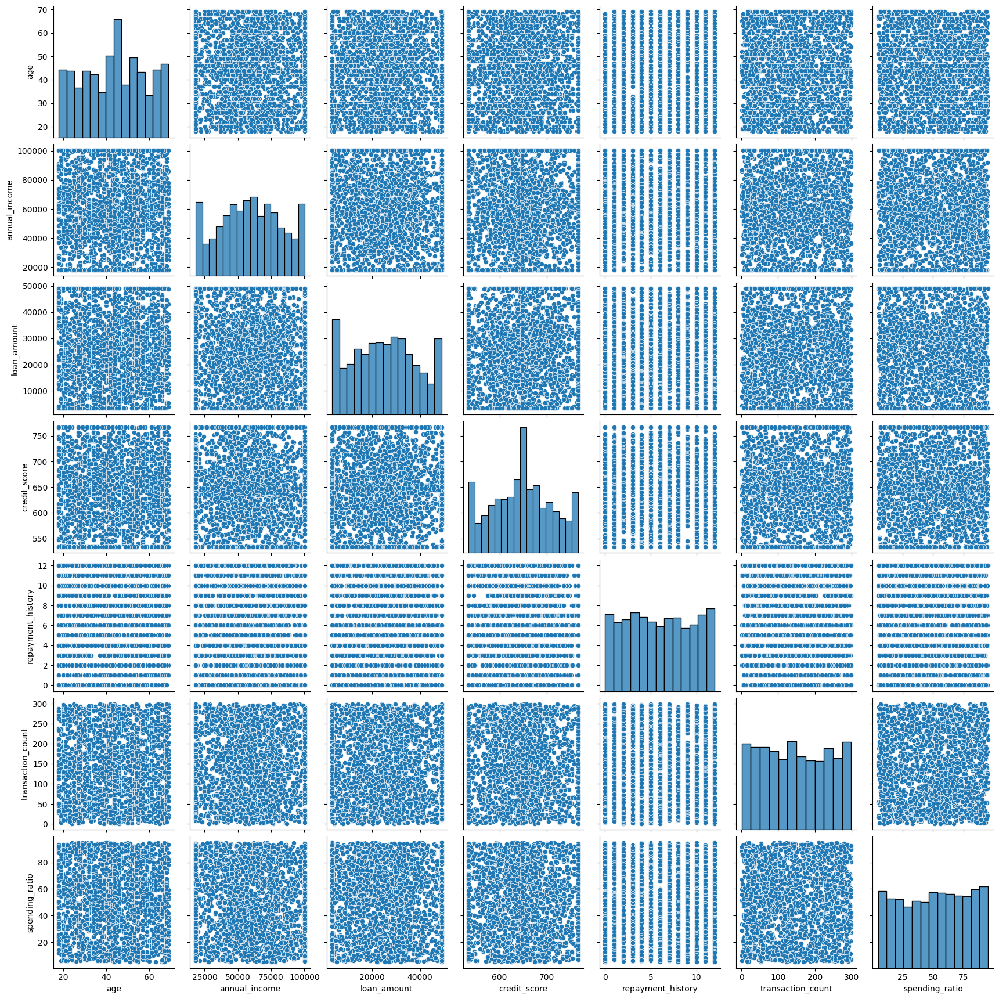

In [170]:
sns.pairplot(df_final[
    ["age","annual_income","loan_amount","credit_score","repayment_history","transaction_count","spending_ratio"]] 
    ,palette ="viridis")

The pair plot was generated to analyze feature distributions and pairwise relationships. The visualization shows improved symmetry in transformed variables and meaningful relationships between engineered features. Class-wise separation is visible in certain combinations, confirming that the dataset is prepared and suitable for machine learning modeling.

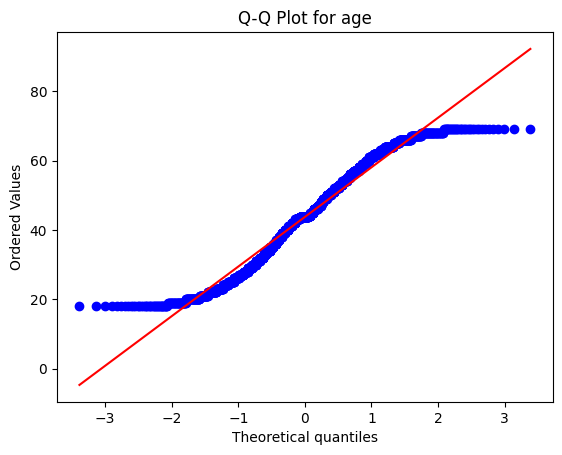

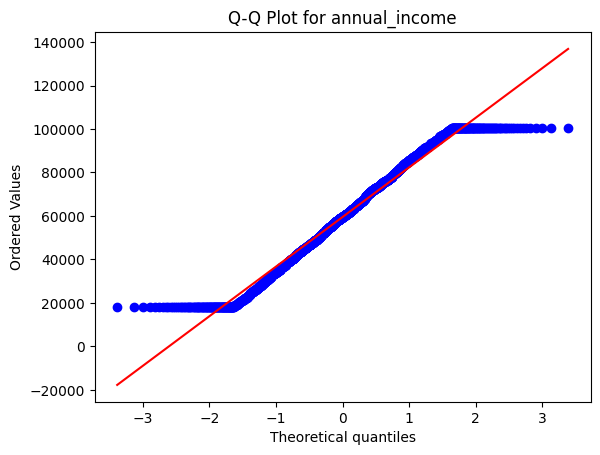

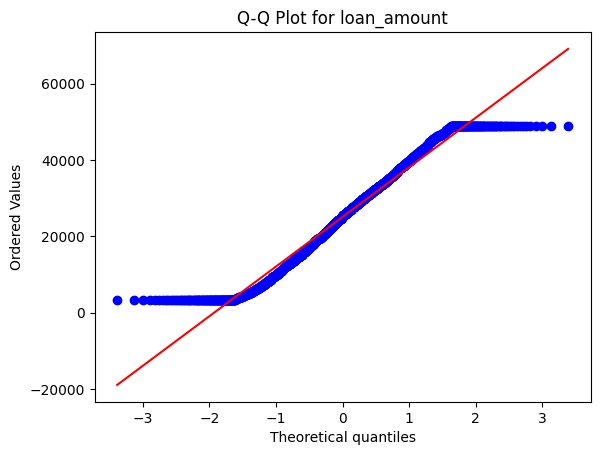

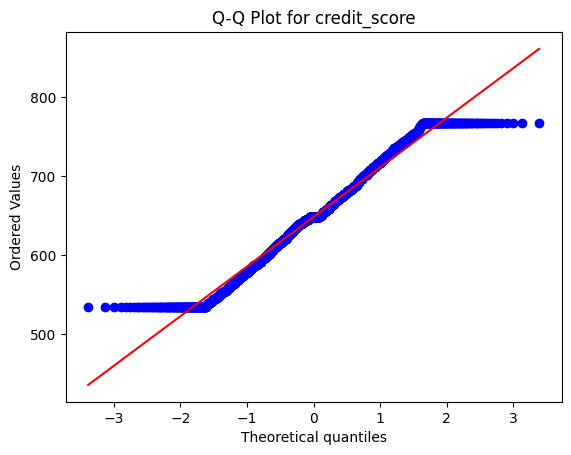

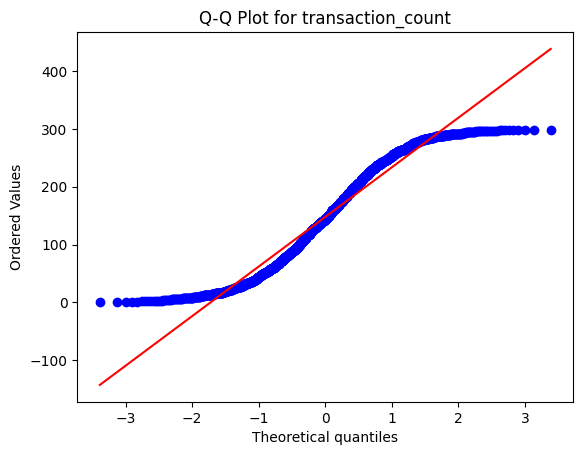

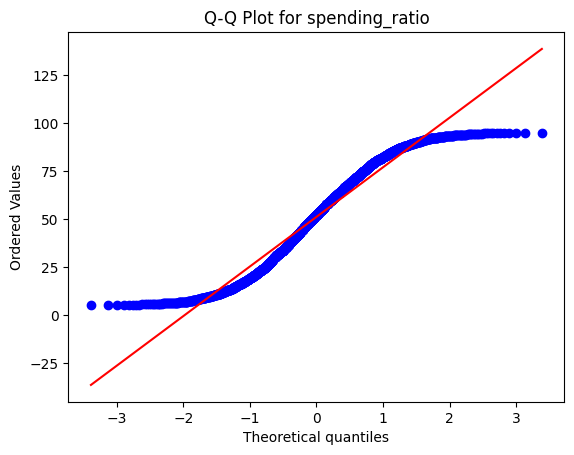

In [168]:
import scipy.stats as stats
columns = ["age","annual_income","loan_amount",
           "credit_score","transaction_count","spending_ratio"]

for col in columns:
    plt.figure()
    stats.probplot(df_final[col], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot for {col}")
    plt.show()

The Q-Q plot indicates that the distribution is approximately normal with slight deviations at the tails. These deviations may be due to remaining skewness or minor outliers. Overall, the transformation has improved the distribution and made it more suitable for machine learning algorithms.

In [175]:
df_final.shape

(1957, 28)

In [173]:
df_final.head()

,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_South,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin
0,100001.0,56.0,NaN,NaN,Salaried,94913.86,7438.8400,671.0,6.0,34.0,...,False,False,False,False,True,False,High,1,Q4,0
1,100002.0,69.0,NaN,NaN,Salaried,30853.63,37162.2800,682.0,12.0,288.0,...,True,False,False,False,True,False,Medium,0,Q1,2
2,100003.0,46.0,NaN,NaN,Salaried,57234.09,8660.3500,590.0,3.0,255.0,...,True,False,False,False,False,False,Medium,0,Q2,1
3,100004.0,32.0,NaN,NaN,Salaried,48368.82,48962.0812,740.0,0.0,126.0,...,False,False,True,False,False,False,Medium,0,Q2,1
4,100005.0,60.0,NaN,NaN,Salaried,75061.14,34934.5800,671.0,7.0,209.0,...,False,False,False,True,False,False,High,1,Q3,0


In [171]:
df_final.describe()

,customer_id,age,gender,education_level,annual_income,loan_amount,credit_score,repayment_history,transaction_count,spending_ratio,join_date,default_flag,join_year,join_month,join_weekday,join_day,high_income_flag,income_kmeans_bin
count,1957.000000,1957.000000,0.0,0.0,1957.000000,1957.000000,1957.000000,1957.000000,1957.000000,1957.000000,1957,1957.000000,1957.0,1957.0,1957.0,1957.0,1957.000000,1957.000000
mean,101001.175268,43.739007,NaN,NaN,59562.333975,25077.015062,648.398863,6.012264,147.775677,51.068733,2026-02-20 09:52:21.544200,0.396525,2026.0,2.0,4.0,20.0,0.353091,0.940215
min,100001.000000,18.000000,NaN,NaN,18130.161600,3302.236000,534.000000,0.000000,1.000000,5.000000,2026-02-20 09:52:18,0.000000,2026.0,2.0,4.0,20.0,0.000000,0.000000
25%,100499.000000,32.000000,NaN,NaN,42525.580000,14538.840000,601.000000,3.000000,71.000000,28.170000,2026-02-20 09:52:18,0.000000,2026.0,2.0,4.0,20.0,0.000000,0.000000
50%,101004.000000,43.835789,NaN,NaN,59568.710000,25285.130000,648.474737,6.000000,145.000000,52.050000,2026-02-20 09:52:24,0.000000,2026.0,2.0,4.0,20.0,0.000000,1.000000
75%,101502.000000,56.000000,NaN,NaN,76502.390000,34761.120000,692.000000,9.000000,227.000000,73.900000,2026-02-20 09:52:24,1.000000,2026.0,2.0,4.0,20.0,1.000000,2.000000
max,102000.000000,69.000000,NaN,NaN,100428.413600,48962.081200,767.000000,12.000000,299.000000,94.990000,2026-02-20 09:52:24,1.000000,2026.0,2.0,4.0,20.0,1.000000,2.000000
std,577.784960,14.543361,NaN,NaN,23106.250848,13203.396444,63.431006,3.805449,87.937293,26.419933,NaN,0.489301,0.0,0.0,0.0,0.0,0.478053,0.771424


In [174]:
df_final.tail()

,customer_id,age,gender,education_level,employment_type,annual_income,loan_amount,credit_score,repayment_history,transaction_count,...,region_South,region_West,loan_purpose_Car,loan_purpose_Education,loan_purpose_Home,loan_purpose_Other,income_group,high_income_flag,income_quantile,income_kmeans_bin
1995,101996.0,63.0,NaN,NaN,Salaried,69545.20,26598.43,602.0,0.0,234.0,...,True,False,False,True,False,False,Medium,0,Q3,1
1996,101997.0,67.0,NaN,NaN,Self-Employed,96712.73,21557.52,615.0,2.0,268.0,...,True,False,True,False,False,False,High,1,Q4,0
1997,101998.0,69.0,NaN,NaN,Self-Employed,38187.88,32480.66,767.0,1.0,104.0,...,False,False,False,False,False,True,Medium,0,Q1,2
1998,101999.0,24.0,NaN,NaN,Salaried,33894.01,15405.69,599.0,2.0,134.0,...,False,True,False,False,False,False,Medium,0,Q1,2
1999,102000.0,20.0,NaN,NaN,Self-Employed,74750.58,4079.13,640.0,4.0,33.0,...,True,False,False,False,True,False,High,1,Q3,0


UNIVARIATE ANALYSIS

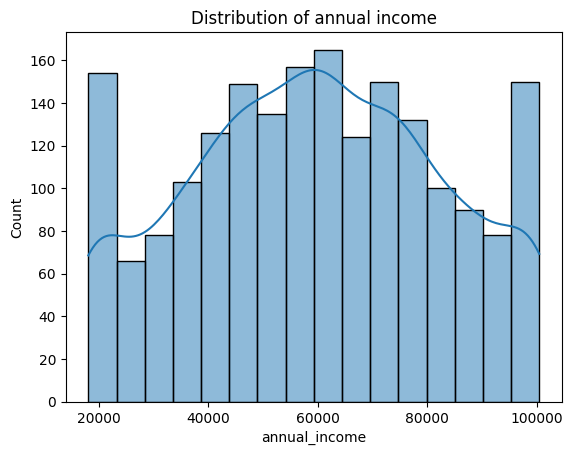

In [177]:
sns.histplot(df_final['annual_income'], kde=True)
plt.title("Distribution of annual income")
plt.show()

The histogram shows the distribution of the variable.

BIVARIATE ANALYSIS

(Relationship between two variables)

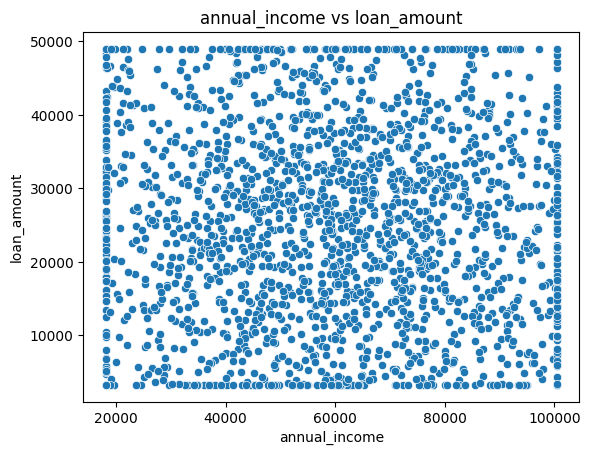

In [180]:
sns.scatterplot(x=df['annual_income'], y=df['loan_amount'])
plt.title("annual_income vs loan_amount")
plt.show()


FINAL SUMMARY

Data Preprocessing & Feature Engineering

This project focused on preparing a raw financial dataset for machine learning modeling through systematic data preprocessing, transformation, and feature engineering.

 1. Data Understanding

The dataset contained both numerical and categorical variables related to customer financial and demographic information. Initial inspection using .info(), .describe(), and .head() helped understand:

Data types

Missing values

Distribution of variables

Potential inconsistencies

 2. Missing Value Treatment

Missing values were identified and handled appropriately:

Numerical columns were treated using statistical imputation techniques.

Categorical columns were cleaned and filled where necessary.

Blank values were converted into proper NaN format before treatment.

After preprocessing, the dataset contained no missing values, ensuring modeling reliability.

 3. Outlier Detection & Handling

Outliers were detected using:

IQR Method

Boxplot visualization

Instead of removing records, appropriate handling techniques such as capping were applied to preserve dataset size while reducing extreme influence.

This improved distribution stability and reduced skewness.

 4. Encoding of Categorical Variables

Categorical features were converted into numerical format using:

One-Hot Encoding

Dummy variable trap was avoided using drop_first=True

This ensured compatibility with machine learning algorithms.

 5. Feature Scaling

Multiple scaling techniques were applied:

Standardization (Z-score scaling)

Min-Max Scaling

MaxAbs Scaling

Robust Scaling

Scaling ensured all features were on comparable ranges and improved model performance.

 6. Feature Transformation

To address skewness and non-normality:

Log transformation was applied to positively skewed variables.

Q-Q plots were used to verify normality improvements.

Where necessary, advanced transformations were analyzed.

These transformations improved distribution symmetry and reduced the impact of extreme values.

 7. Feature Engineering

New meaningful variables were constructed to enhance predictive capability, such as:

Financial ratio features

Derived behavioral indicators

Feature construction improved interpretability and model readiness.

 8. Exploratory Data Analysis
Univariate Analysis

Histograms and boxplots were used to study individual variable distributions.

Bivariate Analysis

Scatter plots and correlation heatmaps identified relationships and multicollinearity.

Multivariate Analysis

Pair plots helped visualize interactions among multiple variables and assess class separability.

 9. Final Dataset Readiness

After completing all preprocessing steps:

No missing values remain

Outliers treated

Categorical variables encoded

Features scaled and transformed

New engineered features added

Relationships validated through visualization

The dataset is now clean, structured, and fully prepared for machine learning modeling.

Final Conclusion

The complete preprocessing pipeline successfully transformed raw data into a high-quality analytical dataset. Systematic cleaning, transformation, scaling, and feature engineering improved distribution balance, reduced noise, and enhanced predictive potential. The final dataset is robust, well-structured, and ready for implementation in machine learning algorithms.